### @Collector and Speaker : little snow
### @Owner : 考研数学计算机之路 2024-2025 LLM微调实战项目

In [14]:
import torch

### 这是一个简单的RNN需要的参数：
# 
### batch_size：每个批次中样本的数量。它决定了在一次前向传播中处理多少个样本。较大的batch_size可以提高训练速度，但也会增加内存消耗。
# 
### seq_len：输入序列的长度。它表示每个输入样本中包含的时间步数。在处理序列数据时，seq_len是非常重要的，因为它影响到RNN的结构和计算。
# 
### input_size：输入特征的维度。它表示每个时间步的输入数据的特征数量。例如，在处理文本时，input_size可能是字符或词的嵌入维度。
# 
### hidden_size：RNN隐藏层的单元数量。它决定了RNN在每个时间步的输出维度。较大的hidden_size可以捕捉更多的特征，但也会增加模型的复杂性。
# 
### num_layers：RNN的层数。它表示堆叠的RNN层的数量。增加层数可以提高模型的表达能力，但也可能导致训练变得更加困难。


In [15]:
batch_size = 1
seq_len = 3  
input_size = 4
hidden_size = 2
num_layers = 1

### RNN中的seq_len(序列长度)和时间步(time steps)
### 1. 基本概念
#### **seq_len**:表示输入序列的长度,即有多少个连续的输入数据点
#### **时间步**:表示RNN展开后的步数,每个时间步处理一个输入数据点

### 2. 关系说明
#### **seq_len = 时间步数**
#### 如果输入序列长度为10,那么RNN就会展开10个时间步
#### 每个时间步处理序列中的一个元素

### 3. 权重维度自动设定 ( W )：
RNN的权重矩阵 𝑊 通常分为两个部分：输入到隐藏层的权重和隐藏层到隐藏层的权重。
输入到隐藏层的权重矩阵的维度为 (hidden_size,input_size)，这意味着每个隐藏单元的输入特征数量等于输入的特征维度。
隐藏层到隐藏层的权重矩阵的维度为 
()
(hidden_size,hidden_size)，这意味着每个隐藏单元的输出会影响下一个时间步的隐藏状态。
### 4. 偏置维度自动设定 ( b )：
偏置向量的维度为 (hidden_size)，这意味着每个隐藏单元都有一个对应的偏置值。
因此，RNN的权重和偏置的维度会根据你在创建RNN时指定的 input_size 和 hidden_size **自动计算**。这样可以确保模型的结构与输入数据的维度相匹配。

In [16]:
# 设定输入的值input_size，和隐层的值hidden_size，他就会自动帮你确定权重W的维度和偏置b的维度
cell = torch.nn.RNN(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers)

### 这段代码用于初始化输入数据和隐藏状态。
### inputs是一个随机生成的张量，形状为(seq_len, batch_size, input_size)，表示输入序列的特征。
### hidden是一个全零的张量，形状为(num_layers, batch_size, hidden_size)，表示RNN的初始隐藏状态。


In [17]:
# 生成一个随机输入张量，形状为(seq_len, batch_size, input_size)，表示输入序列的特征
inputs = torch.randn(seq_len, batch_size, input_size)

# 创建一个全零的张量，形状为(num_layers, batch_size, hidden_size)，表示RNN的初始隐藏状态
hidden = torch.zeros(num_layers, batch_size, hidden_size)

### 使用RNN不用自己写循环，它**自动循环**，所以输入**inputs**的时候要把所有的序列都送进去，然后给定**h0**,我们就会得到所有的隐层输出以及最后一层的输出

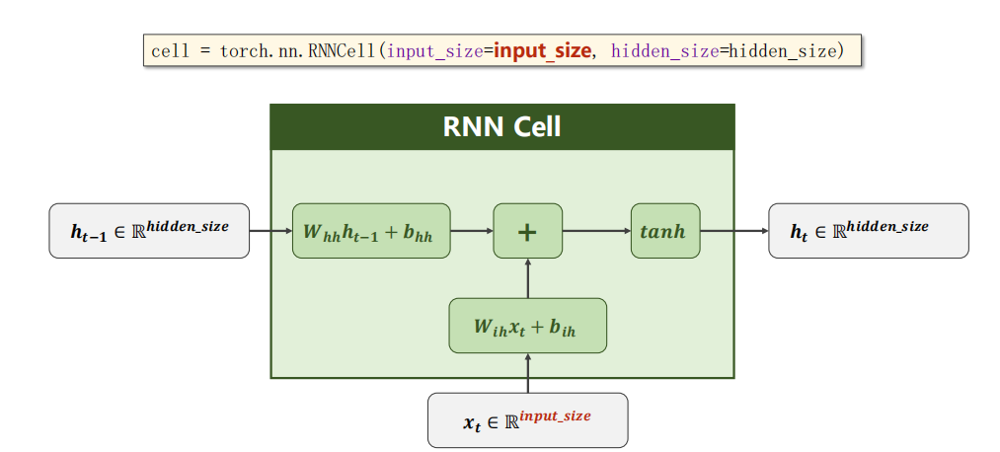

In [2]:
from IPython import display
display.Image(filename="picture/rnn块内部参数计算.png", width=800)

In [19]:
# 使用RNN模型进行前向传播，得到输出和隐藏状态
# out: RNN在每个时间步的输出，形状为(seq_len, batch_size, hidden_size)或(batch_size, seq_len, hidden_size)（取决于batch_first参数）
# hidden: RNN的最终隐藏状态，形状为(num_layers, batch_size, hidden_size)，表示最后一个时间步的隐藏状态
out, hidden = cell(inputs, hidden)

In [21]:
# 输出
print('Output size:',out.shape)
print('Output:',out)
print('Hidden size:',hidden.shape)
print('Hidden',hidden)

Output size: torch.Size([3, 1, 2])
Output: tensor([[[-0.3942,  0.8538]],

        [[-0.3606, -0.0780]],

        [[-0.6812, -0.3404]]], grad_fn=<StackBackward0>)
Hidden size: torch.Size([1, 1, 2])
Hidden tensor([[[-0.6812, -0.3404]]], grad_fn=<StackBackward0>)


### 单个时间步序列多输入RNN

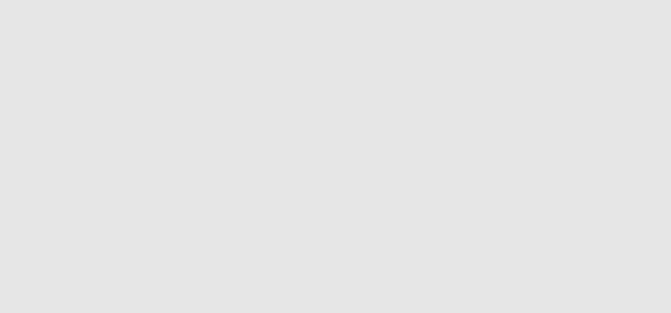

In [3]:
display.Image(filename="picture/rnn单个时间步序列多输入.gif", width=600)

### 多个时间步多序列输入RNN

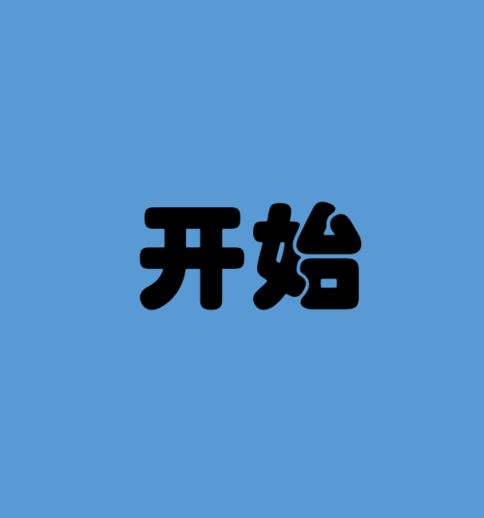

In [4]:
display.Image(filename="picture/多时间步多输入.gif", width=400)

### 如果初始化RNN时，还有一个比较重要的参数**batch_first**，如果把他设置成了TRUE,**inputs**的参数batch_size和seq_len需要调换一下位置

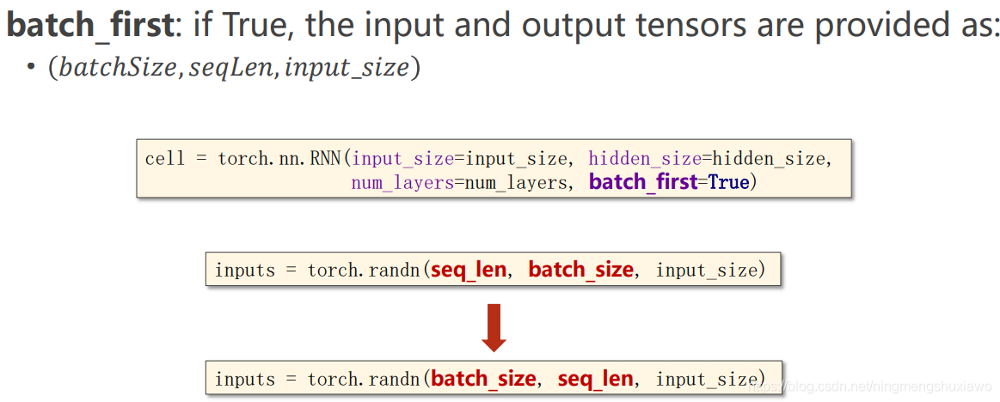

In [5]:
display.Image(filename="picture/rnn_batch_first.png", width=600)

In [23]:
# batch_first = True
cell = torch.nn.RNN(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers, batch_first=True)

# inputs初始化时 batch_size在前，seq_len在后
# inputs = torch.randn(seq_len, batch_size, input_size) 是错误的
inputs = torch.randn(batch_size, seq_len, input_size)

out, hidden = cell(inputs, hidden)

# 输出
print('Output size:',out.shape)
print('Hidden size:',hidden.shape)

Output size: torch.Size([1, 3, 2])
Hidden size: torch.Size([1, 1, 2])
